# Linear Classification

## Part 1

### Task 1
* implementation of analytic linear classifier

#### Necessary imports


In [1]:
from typing import Callable, Dict, Tuple, List
import numpy as np
import sklearn.datasets as ds
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from scipy.optimize import minimize
import tracemalloc
import datetime
import matplotlib.pyplot as plt

#### Classifier implementation


In [2]:
class AnalyticLinearClassifier:
    
    def __init__(self) -> None:
        self.__theta: np.ndarray =None     
        self.__is_fit: bool =False

    def fit(self, train: np.ndarray, targets: np.ndarray) -> None:
        self.__is_fit = False
        self.__targets = list(sorted(set(targets)))
        assert len(self.__targets) == 2, "Analytical classifier is prepared for binary classification problem"
        broadcast_train = np.ones((train.shape[0], train.shape[1] + 1))
        broadcast_train[:, 1:] = train
        self.__theta = np.linalg.inv(broadcast_train.T @ broadcast_train) @ broadcast_train.T @ targets
        self.__is_fit = True

    def decision_function(self, sample: np.ndarray) -> np.ndarray:
        if not self.__is_fit:
            raise Exception("Model has not been fit yet!")
        broadcast_sample = np.ones((sample.shape[0], sample.shape[1] + 1))
        broadcast_sample[:, 1:] = sample
        return broadcast_sample @ self.__theta     

    def predict(self, sample: np.ndarray) -> np.ndarray:
        decisions = self.decision_function(sample)
        return np.where(decisions > np.mean(self.__targets), self.__targets[1], self.__targets[0])

### Task 2
* generate artificial dataset by sklearn.datasets.make_classification
* dataset should contain:
    - 1000 samples
    - 2 traits
    - 2 classes
    - 1 cluster per class
    - random_state is equal to my index number (239512)

#### Constants' and utilities' definition

In [3]:
new_idx_number = 239512
old_idx_number = 215691

In [4]:
def generate_dataset(samples: int =1000, traits: int =2, classes: int =2, clusters: int =1, random_state: int =911) -> Tuple[np.ndarray, np.ndarray]:
    return ds.make_classification(n_samples=samples, n_informative=traits, n_redundant=0, n_features=traits, random_state=random_state, n_clusters_per_class=clusters, n_classes=classes)
    
def normalize_data_set(train: np.ndarray, test: np.ndarray =None) -> Tuple[np.ndarray, np.ndarray]:
    scaler = MinMaxScaler()
    scaler.fit(train)
    return (scaler.transform(train), scaler.transform(test) if test is not None else None)

#### Datasets' generation, split and normalization

In [5]:
X_1, Y_1 = generate_dataset(random_state=new_idx_number)
X_2, Y_2 = generate_dataset(random_state=old_idx_number)
X_1, T_X_1, Y_1, T_Y_1 = train_test_split(X_1, Y_1, stratify=Y_1, random_state=12, test_size=0.2)
X_2, T_X_2, Y_2, T_Y_2 = train_test_split(X_2, Y_2, stratify=Y_2, random_state=91, test_size=0.2)
X_1, T_X_1 = normalize_data_set(X_1, T_X_1)
X_2, T_X_2 = normalize_data_set(X_2, T_X_2)

#### Presentation of generated training datasets

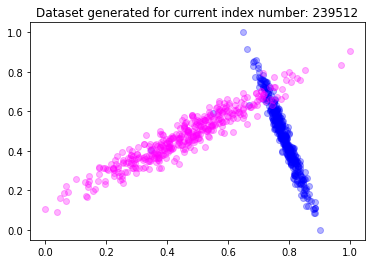

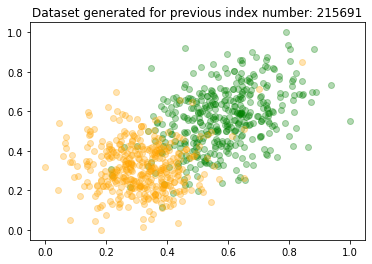

In [6]:
def display_2D_dataset(X, Y, colors=["green", "orange"], title=""):
    fig, ax = plt.subplots()
    unique_Y = list(sorted(set(Y)))
    assert len(colors) == len(unique_Y) and len(X[0]) == 2
    for y, c in zip(unique_Y, colors):
        x = X[Y == y]
        ax.scatter(x[:, 0], x[:, 1], c=[c], alpha=0.3)
    ax.set_title(title)
    plt.show()
display_2D_dataset(X_1, Y_1, colors=["blue", "magenta"], title=f"Dataset generated for current index number: {new_idx_number}")
display_2D_dataset(X_2, Y_2, title=f"Dataset generated for previous index number: {old_idx_number}")

### Task 3
* perform classification on generated datasets using defined, analytic linear classifier.
* show the result of classification using numpy.meshgrid and matplotlib.pyplot.pcolormesh 

#### Additional imports



In [7]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score, accuracy_score
import pandas as pd
from matplotlib.patches import Patch

#### Perform classification

In [8]:
clf_1 = AnalyticLinearClassifier()
clf_2 = AnalyticLinearClassifier()
clf_1.fit(X_1, Y_1)
pred_Y_1 = clf_1.predict(T_X_1)
clf_2.fit(X_2, Y_2)
pred_Y_2 = clf_2.predict(T_X_2)

#### Display metrics


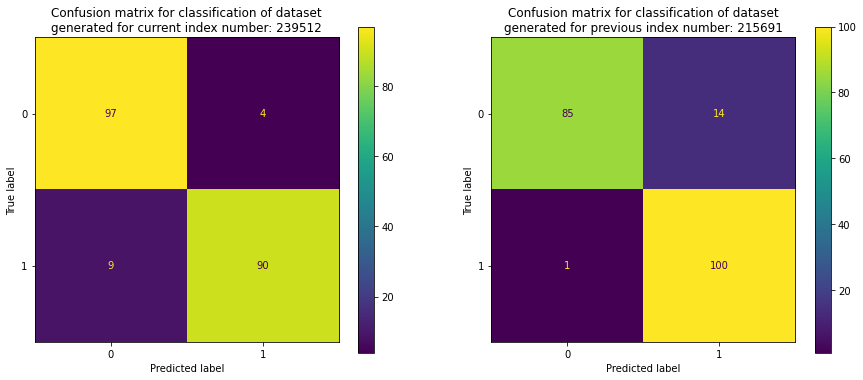

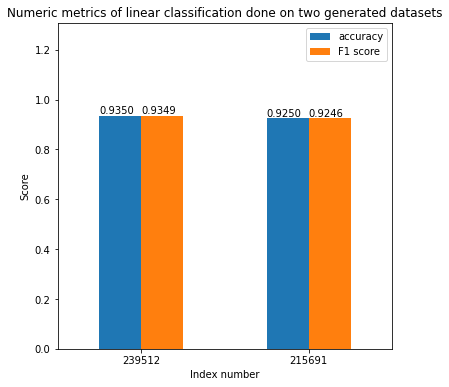

In [9]:
cm_1 = confusion_matrix(T_Y_1, pred_Y_1, labels=list(set(T_Y_1)))
cm_2 = confusion_matrix(T_Y_2, pred_Y_2, labels=list(set(T_Y_2)))

figure_1 = ConfusionMatrixDisplay(cm_1, display_labels=list(set(T_Y_1)))
figure_2 = ConfusionMatrixDisplay(cm_2, display_labels=list(set(T_Y_2)))
fig, axes = plt.subplots(1,2, figsize=(15,6))
figure_1.plot(ax=axes[0])
figure_2.plot(ax=axes[1])
axes[0].set_title(f"Confusion matrix for classification of dataset\ngenerated for current index number: {new_idx_number}")
axes[1].set_title(f"Confusion matrix for classification of dataset\ngenerated for previous index number: {old_idx_number}")
plt.show()
metrics = {new_idx_number:{'accuracy':0, 'F1 score':0}, old_idx_number:{'accuracy':0, 'F1 score':0}}
metrics[new_idx_number]['accuracy'] = accuracy_score(T_Y_1, pred_Y_1)
metrics[old_idx_number]['accuracy'] = accuracy_score(T_Y_2, pred_Y_2)
metrics[new_idx_number]['F1 score'] = f1_score(T_Y_1, pred_Y_1, average='weighted')
metrics[old_idx_number]['F1 score'] = f1_score(T_Y_2, pred_Y_2, average='weighted')

df = pd.DataFrame.from_dict(metrics, orient='index')
fig, ax = plt.subplots(figsize=(6,6))
ax = df.plot.bar(rot=0, ax=ax)
ax.set_title("Numeric metrics of linear classification done on two generated datasets")
for p in ax.patches:
    ax.annotate(f"{p.get_height():.4f}", (p.get_x(), p.get_height()*1.01))
plt.ylim(top=df['accuracy'].max()*1.4)
plt.ylabel("Score")
plt.xlabel("Index number")
plt.show()

#### Display the features' space split

In [10]:
def make_meshgrid(x, y, h=.02):
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    return xx, yy

def plot_contours(ax, clf, xx, yy, **params):
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z_r = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z_r, **params)
    ax.contour(xx, yy, Z_r, colors="black", alpha=params['alpha'], antialiased=True, linewidths=0.4 )

def plot_classification_split_using_contourf(title, clf, X, Y, colors, y_label, x_label, alpha=0.5):
    fig, ax = plt.subplots()

    X0, X1 = X[:, 0], X[:, 1]
    xx, yy = make_meshgrid(X0, X1)
    targets = list(sorted(set(Y)))
    plot_contours(ax, clf, xx, yy, levels=[min(targets), np.mean(targets), max(targets)], colors=colors, alpha=0.5)

    for cl, color in zip(targets, colors[:2]):
        x0 = X0[Y == cl]
        x1 = X1[Y == cl]
        ax.scatter(x0, x1, c=[color],  s=20, edgecolors='k', zorder=911)

    ax.set_ylabel(y_label)
    ax.set_xlabel(x_label)
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(title)
    ax.legend([
            Patch(facecolor=colors[0]),
            Patch(facecolor=colors[1])
        ], [f"Class: {targets[0]}",f"Class: {targets[1]}"], loc='upper left', bbox_to_anchor=(1,1,1,0))

    plt.show()

def plot_classification_split_using_colormesh(title, clf, X, Y, cmap, colors, y_label, x_label, alpha=0.5):
    fig, ax = plt.subplots()
    X0, X1 = X[:, 0], X[:, 1]
    xx, yy = make_meshgrid(X0, X1)
    targets = list(sorted(set(Y)))

    zz = clf.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    plt.pcolormesh(xx,yy,zz, cmap=cmap, alpha=alpha, shading='nearest', linewidth=0.01, edgecolor="w")

    for cl, color in zip(targets, colors[:2]):
        x0 = X0[Y == cl]
        x1 = X1[Y == cl]
        ax.scatter(x0, x1, c=[color],  s=20, edgecolors='k', zorder=911)

    ax.set_ylabel(y_label)
    ax.set_xlabel(x_label)
    ax.set_xticks(())
    ax.set_yticks(())

    ax.set_title(title)
    ax.legend([
            Patch(facecolor=colors[0]),
            Patch(facecolor=colors[1])
        ], [f"Class: {targets[0]}",f"Class: {targets[1]}"], loc='upper left', bbox_to_anchor=(1,1,1,0))
    plt.show()


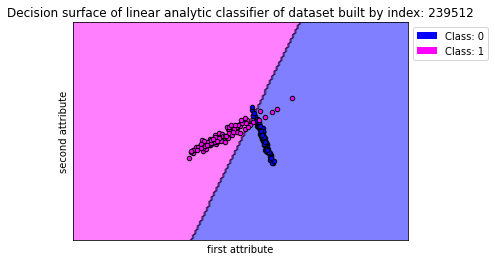

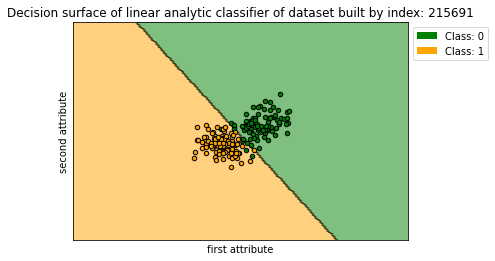

In [11]:
plot_classification_split_using_contourf(f"Decision surface of linear analytic classifier of dataset built by index: {new_idx_number}", 
                                         clf_1, T_X_1, T_Y_1, ["blue","magenta", "white"], "second attribute", "first attribute")
plot_classification_split_using_contourf(f"Decision surface of linear analytic classifier of dataset built by index: {old_idx_number}", 
                                         clf_2, T_X_2, T_Y_2, ["green","orange", "white"], "second attribute", "first attribute")

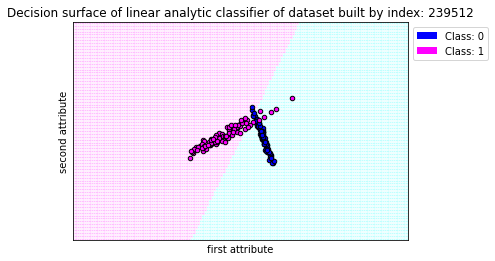

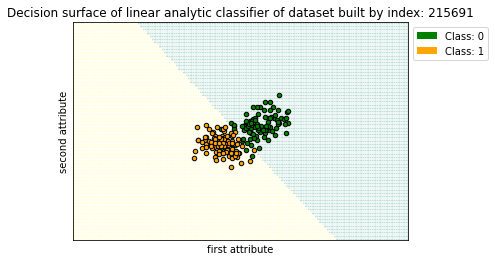

In [12]:
plot_classification_split_using_colormesh(f"Decision surface of linear analytic classifier of dataset built by index: {new_idx_number}", 
                                         clf_1, T_X_1, T_Y_1,plt.get_cmap('cool'), ["blue","magenta", "white"], "second attribute", "first attribute")
plot_classification_split_using_colormesh(f"Decision surface of linear analytic classifier of dataset built by index: {old_idx_number}", 
                                         clf_2, T_X_2, T_Y_2, plt.get_cmap('summer'), ["green","orange", "white"], "second attribute", "first attribute")

### Conclusions
* Implemented linear analytic classifier has obtained accurate results, analyzing two artifcial datasets.

## Part 2


### Task 1
- download HeartDisease dataset from https://archive.ics.uci.edu/ml/datasets/Heart+Disease
- the Cleveland's dataset will be downloaded, since, according to documentation of this dataset, it is used often in experiments

#### Additional imports

In [13]:
import seaborn as sb

#### Download data set and load it into dataframe


In [14]:
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/heart-disease/processed.cleveland.data"
header=["age","sex","cp","trestbps","chol","fbs","restecg","thalach","exang","oldpeak","slope","ca","thal","class_diagnosis"]
heart_df = pd.read_csv(url, delimiter=",", names=header)
heart_df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,class_diagnosis
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45.0,1.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,2.0,0.0,7.0,1
299,68.0,1.0,4.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,2.0,2.0,7.0,2
300,57.0,1.0,4.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,2.0,1.0,7.0,3
301,57.0,0.0,2.0,130.0,236.0,0.0,2.0,174.0,0.0,0.0,2.0,1.0,3.0,1


### Task 2
- do the exploratory analysis of downloaded dataset

#### Notes about traits/attributes, according to provided documentation, the number is corresponding to column index in dataframe 
(assuming starting from 1), the type is determined according to documentation 

1. age: age in years; type=(integer, continuous)
2. sex: sex; type=(integer, binary); values=(1 = male; 0 = female)
3. cp: chest pain type; type=(integer, categorical); values={1: typical angina, 2: atypical angina, 3: non-anginal pain, 4: asymptomatic}
4. trestbps: resting blood pressure (in mm Hg on admission to the hospital); type=(float, continuous)
5. chol: serum cholestoral in mg/dl; type=(float, continuous)
6. fbs: (fasting blood sugar > 120 mg/dl); type=(integer, binary); values={1 = true; 0 = false}
7. restecg: resting electrocardiographic results; type=(integer, categorical); values={0: normal, 1: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV), 2: showing probable or definite left ventricular hypertrophy by Estes' criteria}
8. thalach: maximum heart rate achieved; type=(float, continuous) 
9. exang: exercise induced angina; type=(integer, binary); values=(1 = yes; 0 = no)
10. oldpeak = ST depression induced by exercise relative to rest; type=(float, continuous)
11. slope: the slope of the peak exercise ST segment; type=(integer, categorical); values={1: upsloping, 2: flat, 3: downsloping}
12. ca: number of major vessels colored by flourosopy; type=(integer, categorical); values={0,1,2,3} 
13. thal: Thallium stress test indicator; type=(integer, categorical); values={3 = normal; 6 = fixed defect; 7 = reversable defect}
14. class_diagnosis (originally: 'num'): diagnosis of heart disease (angiographic disease status); type=(integer, binary); values={0: Negative, 1,2,3,4: Positive}

- it can be noticed that, several cells contains '?' string as a label of uknown/not measured value
- it is also needed to change datatype of categorical/binary values into int


#### Change '?' into NaNs



In [15]:
heart_df = heart_df.replace('?', np.nan)
heart_df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,class_diagnosis
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45.0,1.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,2.0,0.0,7.0,1
299,68.0,1.0,4.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,2.0,2.0,7.0,2
300,57.0,1.0,4.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,2.0,1.0,7.0,3
301,57.0,0.0,2.0,130.0,236.0,0.0,2.0,174.0,0.0,0.0,2.0,1.0,3.0,1


#### Count missing values

In [16]:
print(heart_df.isna().sum())

age                0
sex                0
cp                 0
trestbps           0
chol               0
fbs                0
restecg            0
thalach            0
exang              0
oldpeak            0
slope              0
ca                 4
thal               2
class_diagnosis    0
dtype: int64


- missing values are present in ca (count of major vessels coloured) and thal (Thallium stress test) columns

#### Remove rows with missing values of variables



In [17]:
heart_df = heart_df.dropna().reset_index(drop=True)
print(heart_df.isna().sum())
print()
heart_df = heart_df.apply(lambda x: x.apply(lambda _x: float(_x)))
heart_df

age                0
sex                0
cp                 0
trestbps           0
chol               0
fbs                0
restecg            0
thalach            0
exang              0
oldpeak            0
slope              0
ca                 0
thal               0
class_diagnosis    0
dtype: int64



,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,class_diagnosis
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0.0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2.0
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1.0
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0.0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,57.0,0.0,4.0,140.0,241.0,0.0,0.0,123.0,1.0,0.2,2.0,0.0,7.0,1.0
293,45.0,1.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,2.0,0.0,7.0,1.0
294,68.0,1.0,4.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,2.0,2.0,7.0,2.0
295,57.0,1.0,4.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,2.0,1.0,7.0,3.0


#### Change floats to integers, where necessary (categories, binary values)


In [18]:
heart_df["sex"] = heart_df["sex"].apply(lambda x: int(x))
heart_df["cp"] = heart_df["cp"].apply(lambda x: int(x))
heart_df["fbs"] = heart_df["fbs"].apply(lambda x: int(x))
heart_df["restecg"] = heart_df["restecg"].apply(lambda x: int(x))
heart_df["exang"] = heart_df["exang"].apply(lambda x: int(x))
heart_df["slope"] = heart_df["slope"].apply(lambda x: int(x))
heart_df["ca"] = heart_df["ca"].apply(lambda x: int(x))
heart_df["thal"] = heart_df["thal"].apply(lambda x: int(x))
heart_df["class_diagnosis"] = heart_df["class_diagnosis"].apply(lambda x: int(x))
heart_df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,class_diagnosis
0,63.0,1,1,145.0,233.0,1,2,150.0,0,2.3,3,0,6,0
1,67.0,1,4,160.0,286.0,0,2,108.0,1,1.5,2,3,3,2
2,67.0,1,4,120.0,229.0,0,2,129.0,1,2.6,2,2,7,1
3,37.0,1,3,130.0,250.0,0,0,187.0,0,3.5,3,0,3,0
4,41.0,0,2,130.0,204.0,0,2,172.0,0,1.4,1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,57.0,0,4,140.0,241.0,0,0,123.0,1,0.2,2,0,7,1
293,45.0,1,1,110.0,264.0,0,0,132.0,0,1.2,2,0,7,1
294,68.0,1,4,144.0,193.0,1,0,141.0,0,3.4,2,2,7,2
295,57.0,1,4,130.0,131.0,0,0,115.0,1,1.2,2,1,7,3


#### Split dataset into train and test datasets

In [19]:
heart_df, test = train_test_split(heart_df, test_size=0.2, stratify=heart_df["class_diagnosis"])
heart_df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,class_diagnosis
9,53.0,1,4,140.0,203.0,1,2,155.0,1,3.1,3,0,7,1
282,58.0,0,4,170.0,225.0,1,2,146.0,1,2.8,2,2,6,2
75,65.0,0,3,160.0,360.0,0,2,151.0,0,0.8,1,0,3,0
205,55.0,1,2,130.0,262.0,0,0,155.0,0,0.0,1,0,3,0
50,41.0,0,2,105.0,198.0,0,0,168.0,0,0.0,1,1,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,58.0,0,4,100.0,248.0,0,2,122.0,0,1.0,2,0,3,0
89,66.0,1,4,120.0,302.0,0,2,151.0,0,0.4,2,0,3,0
137,35.0,1,4,120.0,198.0,0,0,130.0,1,1.6,2,0,7,1
235,49.0,0,2,134.0,271.0,0,0,162.0,0,0.0,2,0,3,0


In [20]:
test

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,class_diagnosis
295,57.0,1,4,130.0,131.0,0,0,115.0,1,1.2,2,1,7,3
234,46.0,1,4,120.0,249.0,0,2,144.0,0,0.8,1,0,7,1
79,58.0,1,4,150.0,270.0,0,2,111.0,1,0.8,1,0,7,3
41,40.0,1,1,140.0,199.0,0,0,178.0,1,1.4,1,0,7,0
153,64.0,1,4,120.0,246.0,0,2,96.0,1,2.2,3,1,3,3
209,41.0,1,3,130.0,214.0,0,2,168.0,0,2.0,2,0,3,0
248,58.0,1,4,146.0,218.0,0,0,105.0,0,2.0,2,1,7,1
201,43.0,1,4,110.0,211.0,0,0,161.0,0,0.0,1,0,7,0
6,62.0,0,4,140.0,268.0,0,2,160.0,0,3.6,3,2,3,3
0,63.0,1,1,145.0,233.0,1,2,150.0,0,2.3,3,0,6,0


__The rest of operations will be performed on training dataset__

#### Display the dependency of 'class_diagnosis' on categorical/binary attributes on nested pie charts

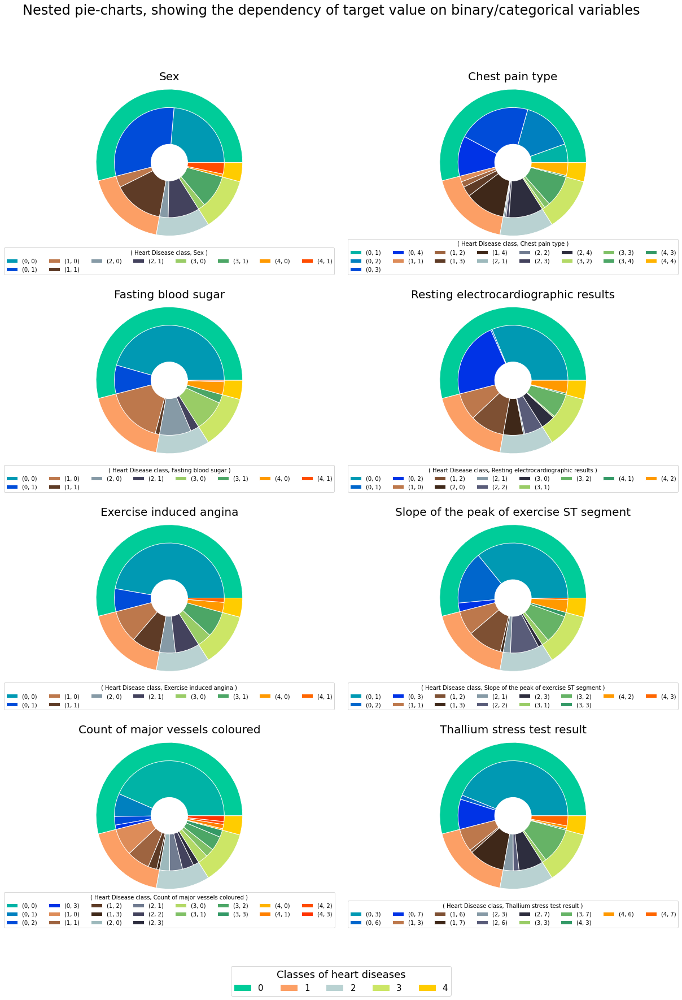

In [21]:
categorical_or_binary = ["sex", "cp", "fbs", "restecg", "exang", "slope", "ca", "thal"]
descs_cat = ["Sex", "Chest pain type", "Fasting blood sugar","Resting electrocardiographic results","Exercise induced angina",
             "Slope of the peak of exercise ST segment","Count of major vessels coloured","Thallium stress test result"]

a,b,c,d,e = [plt.cm.winter, plt.cm.copper, plt.cm.bone, plt.cm.summer, plt.cm.autumn]
class_colors = [a(.8),b(.8),c(.8),d(.8),e(.8)]
attributes_colors = {
    "sex": [a(.6),a(.3),
            b(.6),b(.3),
            c(.6),c(.3),
            d(.6),d(.3),
            e(.6),e(.3)], 
    "cp" : [a(.7),a(.5),a(.3),a(.2),
            b(.7),b(.5),b(.3),b(.2),
            c(.7),c(.5),c(.3),c(.2),
            d(.7),d(.5),d(.3),d(.2),
            e(.7),e(.5),e(.3),e(.2)], 
    "fbs": [a(.6),a(.3),
            b(.6),b(.3),
            c(.6),c(.3),
            d(.6),d(.3),
            e(.6),e(.3)], 
    "restecg": [a(.6),a(.4),a(.2),
                b(.6),b(.4),b(.2),
                c(.6),c(.4),c(.2),
                d(.6),d(.4),d(.2),
                e(.6),e(.4),e(.2)],
    "exang": [a(.6),a(.3),
              b(.6),b(.3),
              c(.6),c(.3),
              d(.6),d(.3),
              e(.6),e(.4)], 
    "slope": [a(.6),a(.4),a(.2),
              b(.6),b(.4),b(.2),
              c(.6),c(.4),c(.2),
              d(.6),d(.4),d(.2),
              e(.6),e(.4),e(.2)], 
    "ca": [a(.7),a(.5),a(.3),a(.2),
           b(.7),b(.5),b(.3),b(.2),
           c(.7),c(.5),c(.3),c(.2),
           d(.7),d(.5),d(.3),d(.2),
           e(.7),e(.5),e(.3),e(.2)], 
    "thal": [a(.6),a(.4),a(.2),
             b(.6),b(.4),b(.2),
             c(.6),c(.4),c(.2),
             d(.6),d(.4),d(.2),
             e(.6),e(.4),e(.2)]
}

fig, axes = plt.subplots(4,2, figsize=(20,25))
size = 0.2
class_label = "class_diagnosis"
classes = list(set(heart_df.class_diagnosis.to_list()))
fig.suptitle("Nested pie-charts, showing the dependency of target value on binary/categorical variables", fontsize=24)

for ax, name, desc in zip(axes.flat, categorical_or_binary, descs_cat):
    pl = heart_df[[class_label, name]].groupby([class_label,name])[name].count().plot.pie(radius=1.6-size, 
                                                                                     colors=attributes_colors[name],
                                                                                     label="", ax=ax, fontsize=13, 
                                                                                     wedgeprops=dict(width=size*5, edgecolor='w'), 
                                                                                     legend=True, labeldistance=None)
                                                                         
    heart_df[[class_label]].groupby([class_label])[class_label].count().plot.pie(ax=ax, radius=1.6, colors=class_colors,
                                                                                 label="", legend=False, labels=classes, 
                                                                                 fontsize=13,wedgeprops=dict(width=size*2, edgecolor='w'), labeldistance=None)
    ax.set_title(desc, fontsize=20, pad=45)
for ax, name, desc in zip(axes.flat, categorical_or_binary, descs_cat):
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[:len(handles)-5], labels=labels[:len(labels)-5], ncol=8,
              title=f"( Heart Disease class, {desc} )", loc="lower center",bbox_to_anchor=(0.5, -0.5)) 
    
fig.legend([Patch(facecolor=color) for color in class_colors],classes, loc="lower center", ncol=5,title_fontsize=18, 
            fontsize=15, title="Classes of heart diseases")
fig.subplots_adjust(hspace=0.9)
plt.show()

#### Display histograms of continuous attributes


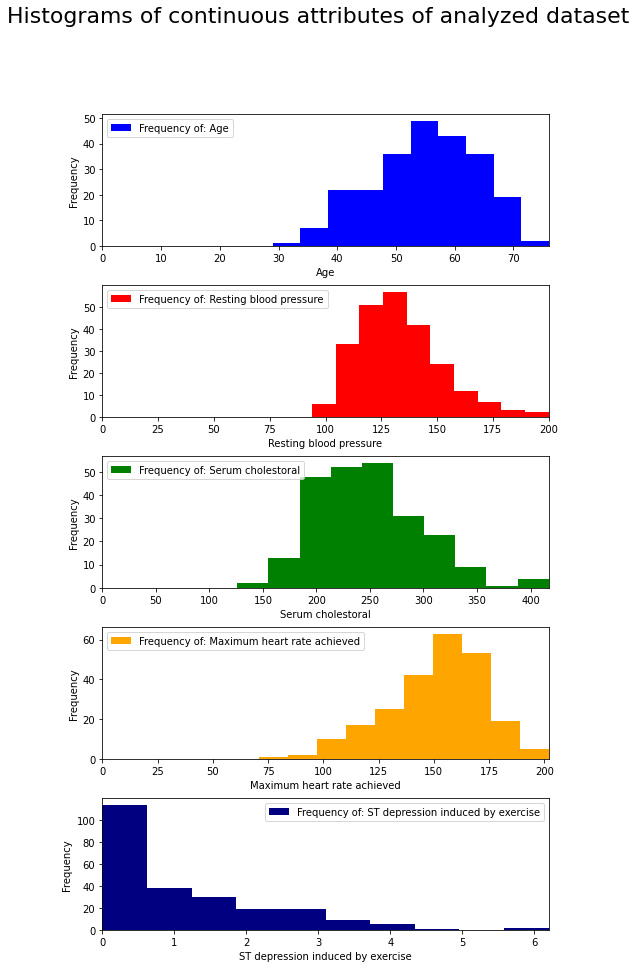

In [22]:
continuous = ["age", "trestbps", "chol","thalach", "oldpeak"]
descs = ["Age", "Resting blood pressure", "Serum cholestoral","Maximum heart rate achieved", "ST depression induced by exercise"]
colors = ["blue","red", "green", "orange", "navy" ]
fig, axes = plt.subplots(5, 1, sharex=False, figsize=(8, 15))
fig.suptitle("Histograms of continuous attributes of analyzed dataset", fontsize=22)
for idx, attribute in enumerate(continuous):
    axes[idx].set_xlim(left=0, right=heart_df[attribute].max())
    axes[idx].set_xlabel(descs[idx])
    heart_df[attribute].plot.hist(ax=axes[idx], color=colors[idx], label=f"Frequency of: {descs[idx]}", legend=True)
fig.subplots_adjust(hspace=0.3)
plt.show()

#### Display correlation matrix of dataset



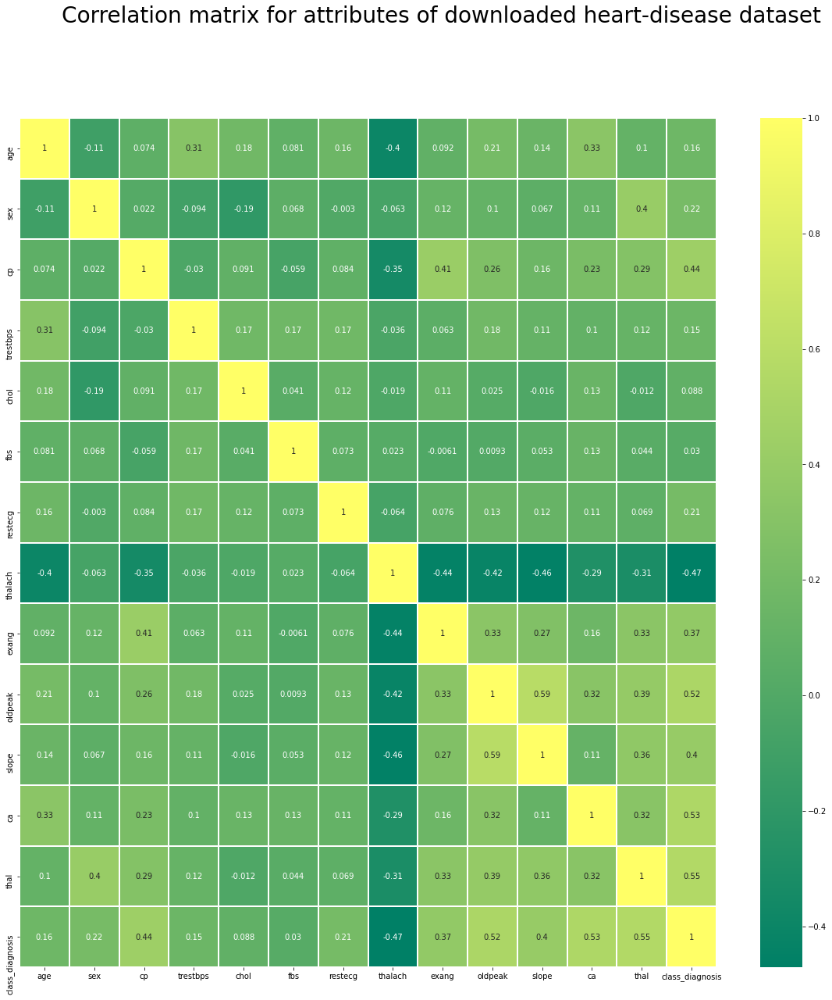

In [23]:
corr = heart_df.corr()

fig, ax = plt.subplots(figsize=(20,20))
fig.suptitle("Correlation matrix for attributes of downloaded heart-disease dataset", fontsize=28)
sb.heatmap(corr, annot=True, linewidth=0.2, ax=ax, cmap="summer")
plt.show()

#### Compute statistical metrics for attributes


- mean of attributes' continuous values

In [24]:
heart_df[continuous].mean()

age          54.831224
trestbps    132.620253
chol        249.059072
thalach     151.033755
oldpeak       1.087342
dtype: float64

- mode of attributes' categorical/binary values

In [25]:
heart_df[categorical_or_binary].mode()

,sex,cp,fbs,restecg,exang,slope,ca,thal
0,1,4,0,0,0,1,0,3


- minimum of attributes' values

In [26]:
heart_df[continuous + categorical_or_binary].min()

age          29.0
trestbps     94.0
chol        126.0
thalach      71.0
oldpeak       0.0
sex           0.0
cp            1.0
fbs           0.0
restecg       0.0
exang         0.0
slope         1.0
ca            0.0
thal          3.0
dtype: float64

- maximum of attributes' values

In [27]:
heart_df[continuous + categorical_or_binary].max()

age          76.0
trestbps    200.0
chol        417.0
thalach     202.0
oldpeak       6.2
sex           1.0
cp            4.0
fbs           1.0
restecg       2.0
exang         1.0
slope         3.0
ca            3.0
thal          7.0
dtype: float64

- standard deviation of attributes' values

In [28]:
heart_df[continuous + categorical_or_binary].std()

age          8.885631
trestbps    18.044886
chol        49.172611
thalach     22.222272
oldpeak      1.211845
sex          0.469327
cp           0.969185
fbs          0.359682
restecg      0.993615
exang        0.464386
slope        0.608205
ca           0.967505
thal         1.952074
dtype: float64

#### Which attributes do seem to be good in terms of classification problem?
- Analyzing correlation matrix, it can be noticed, that some of attributes have a significant impact on heart-disease degree determination
- The resulted set of attributes depends on division of downloaded dataset to train and test datasets.
- The top 5 attributes in terms of good correlation with class_diagnosis column are:
    1. thal (Thallium stress test): 0.55
    2. ca (number of major vessels colored): 0.53
    3. oldpeak (ST depression induced by exercise relative to rest): 0.52
    4. thalach (maximum heart rate achieved): -0.47
    5. cp (chest pain type): 0.44

### Task 3
- 4 features/attributes selection
- classification using RidgeClassifier

Additional imports

In [29]:
from sklearn.feature_selection import SelectKBest, chi2, SequentialFeatureSelector, RFE
from sklearn.neighbors import NearestCentroid
from sklearn.svm import SVR
from sklearn.linear_model import RidgeClassifier

#### Selection according to correlation matrix



In [30]:
target = np.abs(corr[class_label])
target = target[target < 1]
features = target.nlargest(4, keep='all')
new_features= features.index.tolist()
new_features

['thal', 'ca', 'oldpeak', 'thalach']

#### sklearn.feature_selection.SelectKBest using sklearn.feature_selection.chi2 metric

In [31]:
clf = SelectKBest(chi2, k=4)
clf.fit(heart_df[continuous + categorical_or_binary], heart_df[class_label])

mask = clf.get_support()
new_features_chi = [] 
for flag, feature in zip(mask, continuous + categorical_or_binary):
    if flag:
        new_features_chi.append(feature)
new_features_chi

['thalach', 'oldpeak', 'ca', 'thal']

#### sklearn.feature_selection.SequentialFeatureSelector

In [32]:
ridge = RidgeClassifier(alpha=0.0001, solver="saga", random_state=239512, copy_X=True)
seq_clf = SequentialFeatureSelector(ridge, n_features_to_select=4)
seq_clf.fit(heart_df[continuous + categorical_or_binary], heart_df[class_label])
mask = seq_clf.get_support()
new_features_SFS_forw = [] 
for flag, feature in zip(mask, continuous + categorical_or_binary):
    if flag:
        new_features_SFS_forw.append(feature)
new_features_SFS_forw

['age', 'fbs', 'ca', 'thal']

In [33]:
ridge = RidgeClassifier(alpha=0.0001, solver="saga", random_state=239512, copy_X=True)
seq_clf = SequentialFeatureSelector(ridge, n_features_to_select=4, direction="backward")
seq_clf.fit(heart_df[continuous + categorical_or_binary], heart_df[class_label])
mask = seq_clf.get_support()
new_features_SFS_back = [] 
for flag, feature in zip(mask, continuous + categorical_or_binary):
    if flag:
        new_features_SFS_back.append(feature)
new_features_SFS_back

['age', 'exang', 'ca', 'thal']

#### sklearn.feature_selection.RFE

In [34]:
estimator = RidgeClassifier(alpha=0.0001, solver="saga", random_state=239512, copy_X=True)
selector = RFE(estimator, n_features_to_select=4, step=1)
selector.fit(heart_df[continuous + categorical_or_binary], heart_df[class_label])
mask = selector.get_support()
new_features_RFE = [] 
for flag, feature in zip(mask, continuous + categorical_or_binary):
    if flag:
        new_features_RFE.append(feature)
new_features_RFE

['sex', 'exang', 'slope', 'ca']

#### Do analyzed algorithms select the same set of features? 
- All methods of feature selection returned similar sets of best, in terms of possible classification result, attributes
- some of selectors returned attributes that potentially can produce poor results of classification e.g. the feature: 'fbs' is only very slightly correlated with target

#### Classification

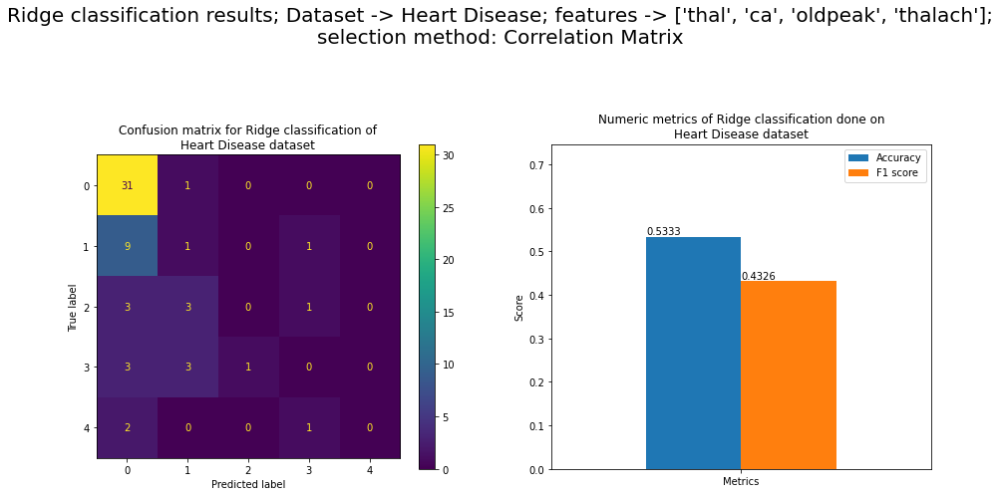

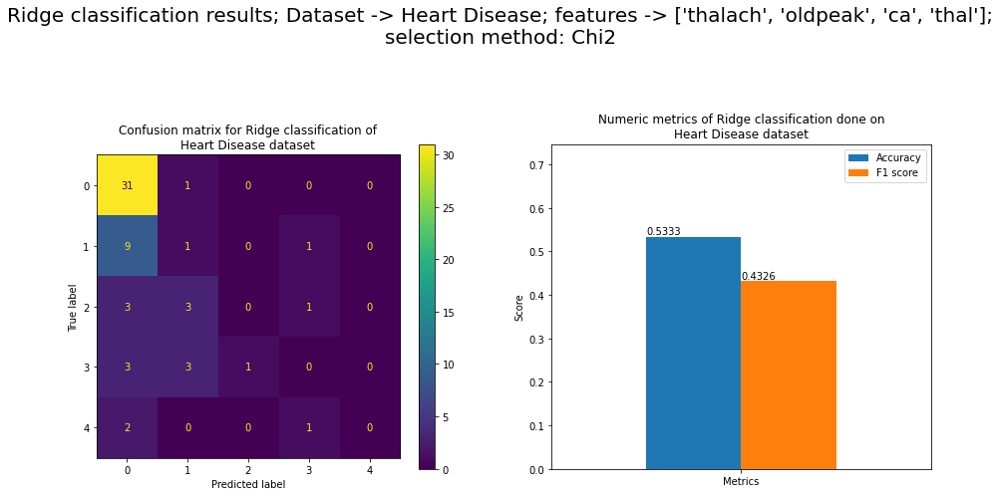

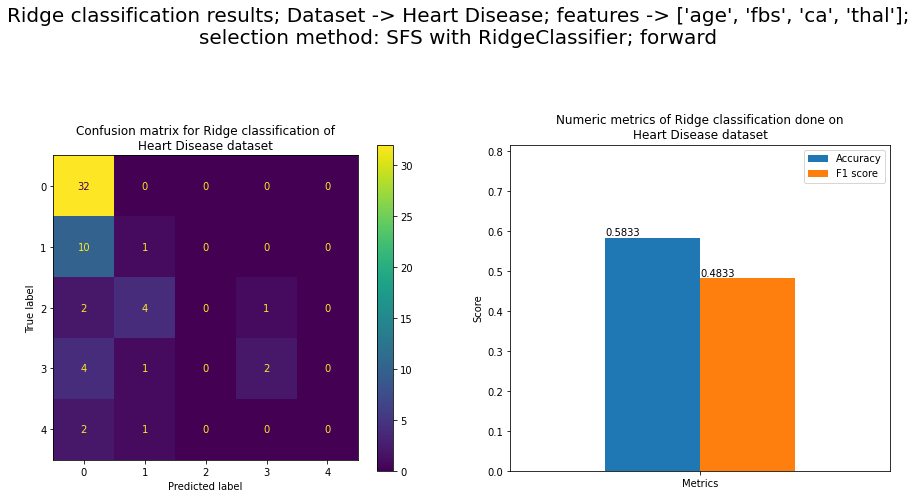

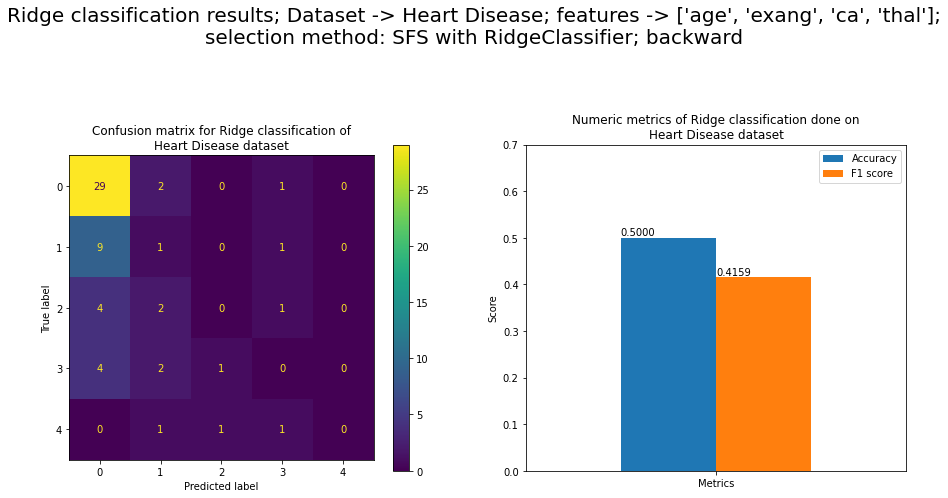

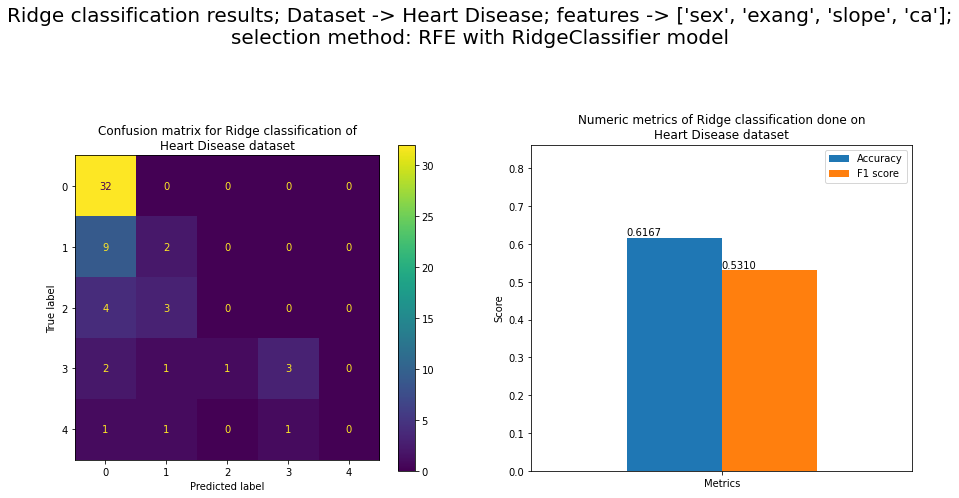

In [35]:
features = {"Correlation Matrix": new_features, 
            "Chi2": new_features_chi, 
            "SFS with RidgeClassifier; forward": new_features_SFS_forw, 
            "SFS with RidgeClassifier; backward": new_features_SFS_back, 
            "RFE with RidgeClassifier model": new_features_RFE}

for title, _features in features.items():
    ridge_clf = RidgeClassifier(alpha=0.0001, solver="saga", random_state=239512, copy_X=True)
    filtered_train_X = heart_df[_features].copy()
    filtered_test_X = test[_features].copy()
    test_Y = test[class_label].copy()
    train_Y = heart_df[class_label].copy()

    ridge_clf.fit(filtered_train_X, train_Y)

    pred_Y = ridge_clf.predict(filtered_test_X)
    fig, axes = plt.subplots(1,2, figsize=(15,6))
    fig.suptitle(f"Ridge classification results; Dataset -> Heart Disease; features -> {_features};\nselection method: {title}", fontsize=20, y=1.2)
    conf_mat = confusion_matrix(test_Y, pred_Y, labels=classes)
    fig_conf = ConfusionMatrixDisplay(conf_mat,display_labels=classes)
    fig_conf.plot(ax=axes[0])
    axes[0].set_title(f"Confusion matrix for Ridge classification of\nHeart Disease dataset")
    acc = accuracy_score(test_Y, pred_Y)
    f1 = f1_score(test_Y, pred_Y, average="weighted")
    met = {"Metrics":{'Accuracy':acc, "F1 score":f1}}
    d = pd.DataFrame.from_dict(met, orient="index")
    
    d.plot.bar(ax=axes[1], rot=0)
    axes[1].set_title(f"Numeric metrics of Ridge classification done on\nHeart Disease dataset")
    for p in axes[1].patches:
        axes[1].annotate(f"{p.get_height():.4f}", (p.get_x(), p.get_height()*1.01))
    axes[1].set_ylim(top=d['Accuracy'].max()*1.4)
    axes[1].set_ylabel("Score")
    fig.subplots_adjust(hspace=0.5)
    plt.show()




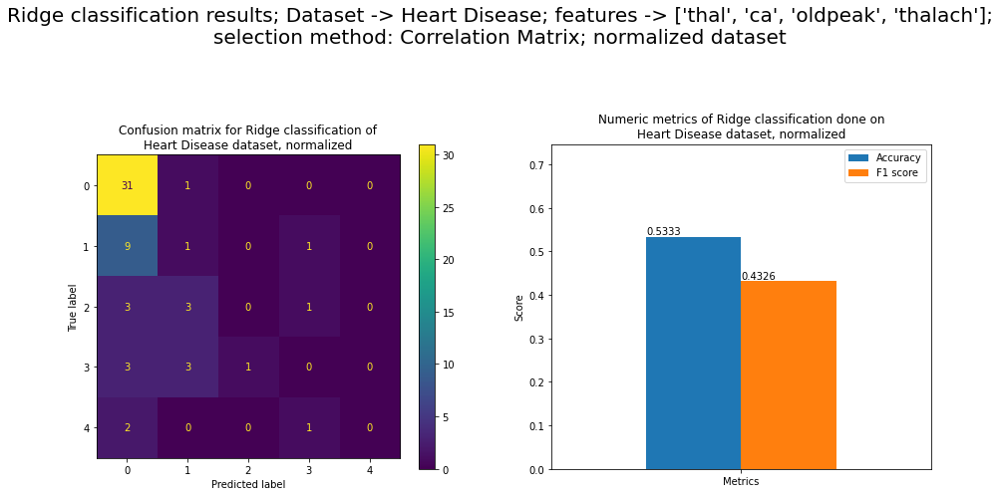

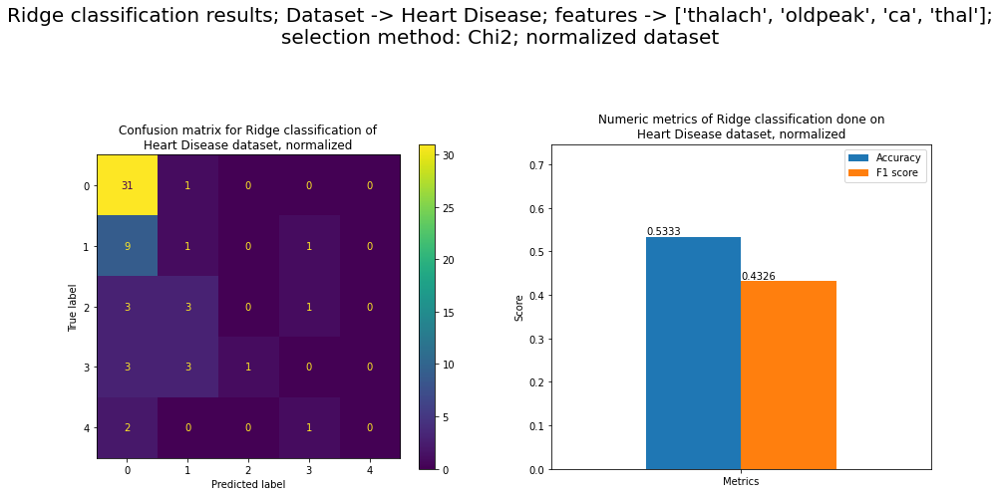

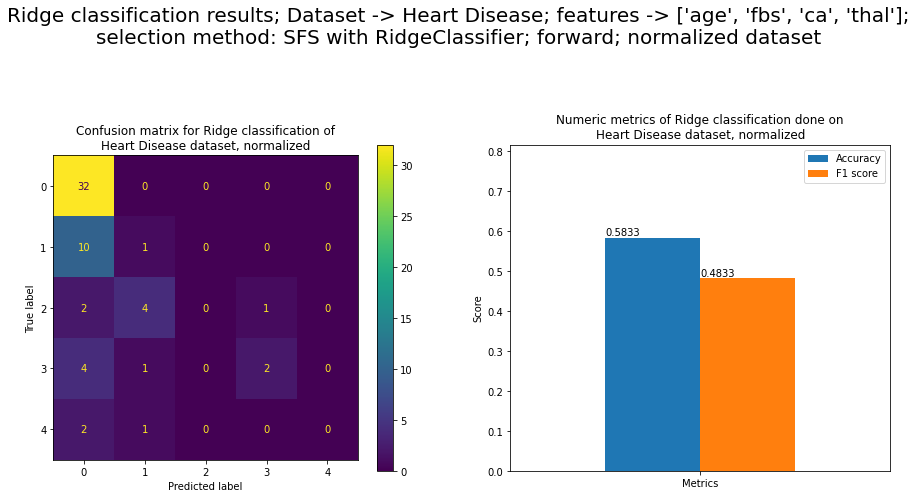

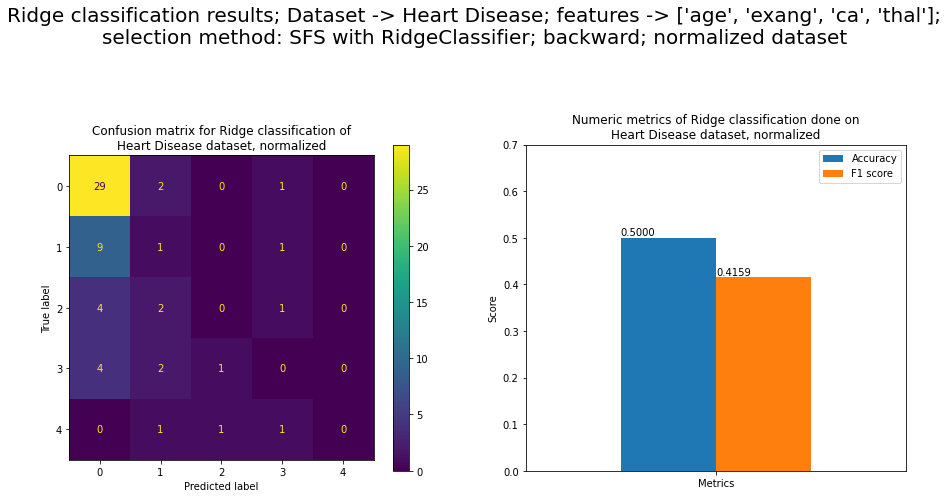

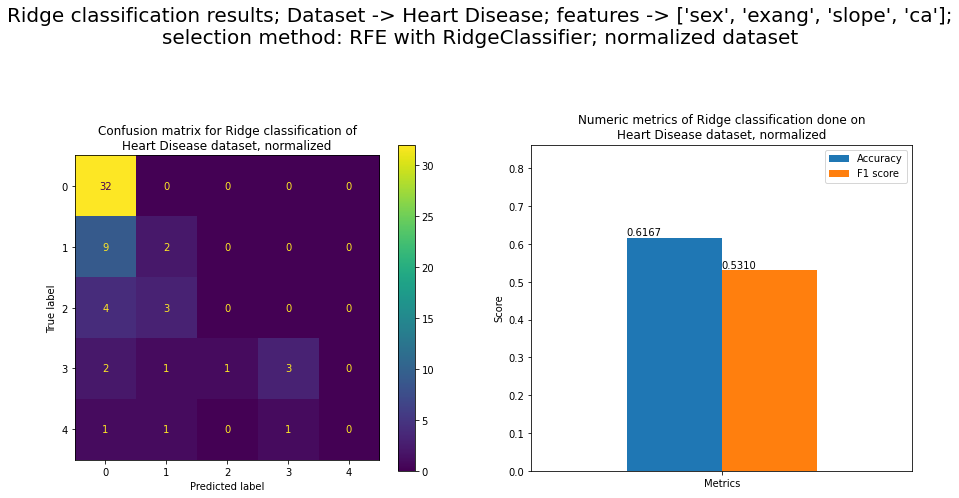

In [36]:
features = {"Correlation Matrix": new_features, 
            "Chi2": new_features_chi, 
            "SFS with RidgeClassifier; forward": new_features_SFS_forw, 
            "SFS with RidgeClassifier; backward": new_features_SFS_back, 
            "RFE with RidgeClassifier": new_features_RFE}
norm_X = heart_df[continuous+categorical_or_binary].copy(True)
norm_test_X = test[continuous+categorical_or_binary].copy(True)
scaler = MinMaxScaler()
scaler.fit(norm_X)
norm_X[continuous+categorical_or_binary] = scaler.transform(norm_X)
norm_test_X[continuous+categorical_or_binary] = scaler.transform(norm_test_X)

for title, _features in features.items():
    ridge_clf = RidgeClassifier(alpha=0.0001,solver="saga", random_state=239512, copy_X = True)
    filtered_train_X = norm_X[_features].copy()
    filtered_test_X = norm_test_X[_features].copy()
    test_Y = test[class_label].copy()
    train_Y = heart_df[class_label].copy()

    ridge_clf.fit(filtered_train_X, train_Y)

    pred_Y = ridge_clf.predict(filtered_test_X)
    fig, axes = plt.subplots(1,2, figsize=(15,6))
    fig.suptitle(f"Ridge classification results; Dataset -> Heart Disease; features -> {_features};\nselection method: {title}; normalized dataset",
                    fontsize=20, y=1.2)
    conf_mat = confusion_matrix(test_Y, pred_Y, labels=classes)
    fig_conf = ConfusionMatrixDisplay(conf_mat,display_labels=classes)
    fig_conf.plot(ax=axes[0])
    axes[0].set_title(f"Confusion matrix for Ridge classification of\nHeart Disease dataset, normalized")
    acc = accuracy_score(test_Y, pred_Y)
    f1 = f1_score(test_Y, pred_Y, average="weighted")
    met = {"Metrics":{'Accuracy':acc, "F1 score":f1}}
    d = pd.DataFrame.from_dict(met, orient="index")
    
    d.plot.bar(ax=axes[1], rot=0)
    axes[1].set_title(f"Numeric metrics of Ridge classification done on\nHeart Disease dataset, normalized")
    for p in axes[1].patches:
        axes[1].annotate(f"{p.get_height():.4f}", (p.get_x(), p.get_height()*1.01))
    axes[1].set_ylim(top=d['Accuracy'].max()*1.4)
    axes[1].set_ylabel("Score")
    fig.subplots_adjust(hspace=0.5)
    plt.show()

#### Conclusions
- After selection of features, I've decided to perform two tests on raw dataset and normalized dataset
- The differences between accuracies of classifiers are very small, however, it is dependent on initial dataset division. The best score (for both datasets) was obtained on features selected by RFE with RidgeRegression as decision model. Generally speaking, the differences between outcomes vary in the course of time, sometimes Chi2 or selection by correlation matrix gave better than RFE's results. Every feature selection method provides accuracy in range from approximaltely 50% to approximately 60% during classification of this dataset.
